<a href="https://colab.research.google.com/github/dote7ant/Regression/blob/master/Regression_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Football analysis for mchezopesa ltd.

## 1. Defining the question

### a. Specifying the question

### b. Defining the metric for success

### c. Understanding the context

### d. Recording the experimental design

### e. Data Relevance

# 1. Reading data and importing libraries

In [13]:
# import the required libraries
import pandas as pd
import pandas_profiling
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split

from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

from sklearn import linear_model, datasets
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import mean_squared_error, accuracy_score, f1_score, confusion_matrix
import warnings
warnings.filterwarnings('ignore')

In [14]:
# importing the data sets
# url to hold the fifa ranking data
url = "/content/fifa_ranking.csv"

# url to hold the match results
url1 = "/content/results.csv"

# read to dataframe
df_ranks = pd.read_csv(url)
df_results = pd.read_csv(url1)


# 2. Checking the data

In [15]:
# Preview the first 5 and last 5 rows 

print("This is the fifa ranking data set \n:", df_ranks.head())
print("This is the match results data set \n:", df_results.head())

This is the fifa ranking data set 
:    rank country_full  ... confederation   rank_date
0     1      Germany  ...          UEFA  1993-08-08
1     2        Italy  ...          UEFA  1993-08-08
2     3  Switzerland  ...          UEFA  1993-08-08
3     4       Sweden  ...          UEFA  1993-08-08
4     5    Argentina  ...      CONMEBOL  1993-08-08

[5 rows x 16 columns]
This is the match results data set 
:          date home_team away_team  ...     city   country neutral
0  1872-11-30  Scotland   England  ...  Glasgow  Scotland   False
1  1873-03-08   England  Scotland  ...   London   England   False
2  1874-03-07  Scotland   England  ...  Glasgow  Scotland   False
3  1875-03-06   England  Scotland  ...   London   England   False
4  1876-03-04  Scotland   England  ...  Glasgow  Scotland   False

[5 rows x 9 columns]


In [16]:
# find the number of rows in the data set
print("The fifa ranking data set has the following rows and columns: \t", df_ranks.shape)
print("The match results data set has the following rows and columns: \t", df_results.shape)

The fifa ranking data set has the following rows and columns: 	 (57793, 16)
The match results data set has the following rows and columns: 	 (40839, 9)


In [17]:
# check the data types of the columns in each data set
print(df_ranks.info())
print("\n************************************************************************************\n")
print(df_results.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57793 entries, 0 to 57792
Data columns (total 16 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   rank                     57793 non-null  int64  
 1   country_full             57793 non-null  object 
 2   country_abrv             57793 non-null  object 
 3   total_points             57793 non-null  float64
 4   previous_points          57793 non-null  int64  
 5   rank_change              57793 non-null  int64  
 6   cur_year_avg             57793 non-null  float64
 7   cur_year_avg_weighted    57793 non-null  float64
 8   last_year_avg            57793 non-null  float64
 9   last_year_avg_weighted   57793 non-null  float64
 10  two_year_ago_avg         57793 non-null  float64
 11  two_year_ago_weighted    57793 non-null  float64
 12  three_year_ago_avg       57793 non-null  float64
 13  three_year_ago_weighted  57793 non-null  float64
 14  confederation         

We observe that the date columns in both data sets is assigned an object data type. This will need to be corrected in the cleaning phase.

### External data validation

The data sets can be validated from the [Fifa page](https://en.wikipedia.org/wiki/FIFA_World_Rankings/) and a detailed explanation of how the ranks are calculated [here](https://www.fifa.com/fifa-world-ranking/procedure/men.html). By analyzing the data in this sites we can verify the data that we have.

# 3. Tidying the data set

In [18]:
# Review the data columns 
print("The fifa rank data set has the following columns:\n", df_ranks.columns)
print("\nThe match results data set has the following columns:\n", df_results.columns)

The fifa rank data set has the following columns:
 Index(['rank', 'country_full', 'country_abrv', 'total_points',
       'previous_points', 'rank_change', 'cur_year_avg',
       'cur_year_avg_weighted', 'last_year_avg', 'last_year_avg_weighted',
       'two_year_ago_avg', 'two_year_ago_weighted', 'three_year_ago_avg',
       'three_year_ago_weighted', 'confederation', 'rank_date'],
      dtype='object')

The match results data set has the following columns:
 Index(['date', 'home_team', 'away_team', 'home_score', 'away_score',
       'tournament', 'city', 'country', 'neutral'],
      dtype='object')


In [19]:
# Checking for missing values
print("Count for the missing values in the fifa ranking data sets:\n", df_ranks.isnull().sum())
print("\nCount for the missing values in the match results:\n", df_results.isnull().sum())

Count for the missing values in the fifa ranking data sets:
 rank                       0
country_full               0
country_abrv               0
total_points               0
previous_points            0
rank_change                0
cur_year_avg               0
cur_year_avg_weighted      0
last_year_avg              0
last_year_avg_weighted     0
two_year_ago_avg           0
two_year_ago_weighted      0
three_year_ago_avg         0
three_year_ago_weighted    0
confederation              0
rank_date                  0
dtype: int64

Count for the missing values in the match results:
 date          0
home_team     0
away_team     0
home_score    0
away_score    0
tournament    0
city          0
country       0
neutral       0
dtype: int64


There are no missing values in both data sets


In [20]:
# check for duplicates
print("If True then duplicates exist, if False Duplicates do not exist.\n Fifa rank data set has duplicates:", df_ranks.duplicated().any())
print("Match results data set has duplicates:", df_results.duplicated().any())

If True then duplicates exist, if False Duplicates do not exist.
 Fifa rank data set has duplicates: True
Match results data set has duplicates: False


We observe that the fifa rank data set has duplicates so we proceed to remove them.

In [21]:
# remove the duplicates from the fifa rank data set
df_ranks.drop_duplicates(keep='first', inplace = True)
# confirm there are no more duplicates
print("The fifa data set has duplicates: ", df_ranks.duplicated().any())

The fifa data set has duplicates:  False


There are no more duplicates.

---
Change the date columns data type to date


In [22]:
# First remove the slash and replace it with a dask
df_results.date = df_results.date.apply(lambda x: x.replace('/', '-'))
df_ranks.rank_date = df_ranks.rank_date.apply(lambda x: x.replace('/', '-'))

# change data types 
df_ranks.rank_date = pd.to_datetime(df_ranks.rank_date)
df_results.date = pd.to_datetime(df_results.date)

# check the data types of the columns in each data set and confirm we have achieved our results
print(df_ranks.info())
print("\n************************************************************************************\n")
print(df_results.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 57756 entries, 0 to 57792
Data columns (total 16 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   rank                     57756 non-null  int64         
 1   country_full             57756 non-null  object        
 2   country_abrv             57756 non-null  object        
 3   total_points             57756 non-null  float64       
 4   previous_points          57756 non-null  int64         
 5   rank_change              57756 non-null  int64         
 6   cur_year_avg             57756 non-null  float64       
 7   cur_year_avg_weighted    57756 non-null  float64       
 8   last_year_avg            57756 non-null  float64       
 9   last_year_avg_weighted   57756 non-null  float64       
 10  two_year_ago_avg         57756 non-null  float64       
 11  two_year_ago_weighted    57756 non-null  float64       
 12  three_year_ago_avg       57756 n

Rename the column names to ones easier to work with.

In [23]:
# rename the column names
df_ranks.rename(columns = {'country_full' : 'country'}, inplace = True)

Check for outliers.

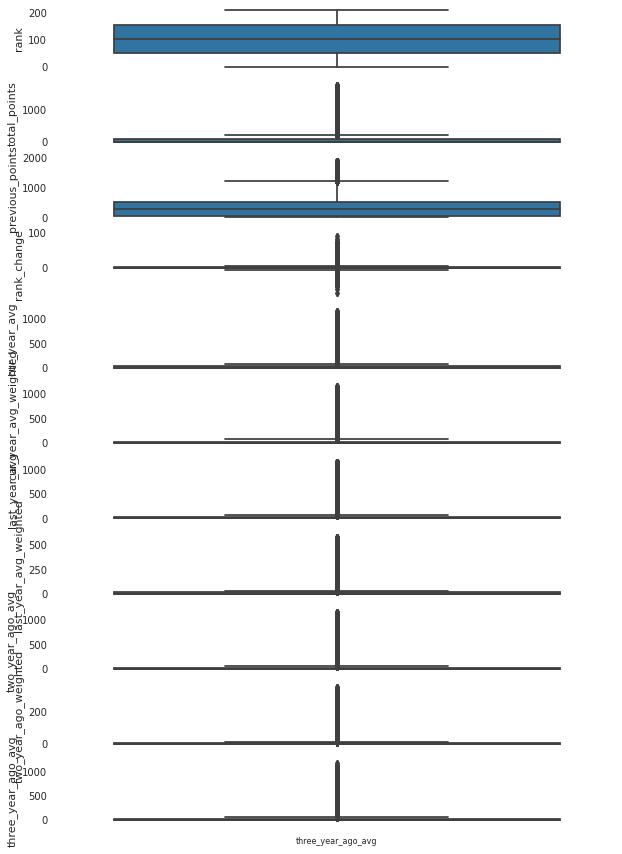

In [24]:
# Finding outliers in the fifa rank data set 
col_names= ['rank', 'total_points', 'previous_points', 'rank_change','cur_year_avg', 'cur_year_avg_weighted', 'last_year_avg',
       'last_year_avg_weighted', 'two_year_ago_avg', 'two_year_ago_weighted',
       'three_year_ago_avg']
fig, ax = plt.subplots(len(col_names), figsize=(10,15))

for i, col_val in enumerate(col_names):

    sns.boxplot(y=df_ranks[col_val], ax=ax[i])
    
    ax[i].set_xlabel(col_val, fontsize=8)

plt.show()

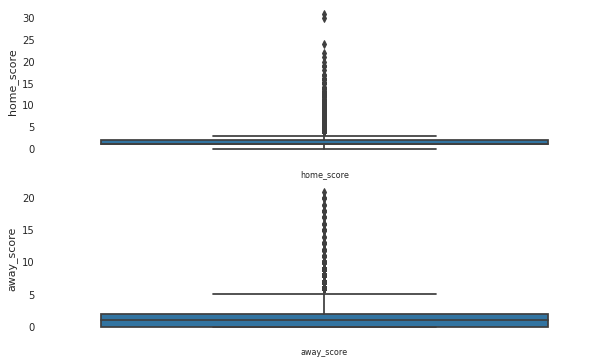

In [25]:
# check for outliers in the match results data set
col_names = ['home_score', 'away_score']
fig, ax = plt.subplots(len(col_names), figsize=(10,6))

for i, col_val in enumerate(col_names):

    sns.boxplot(y=df_results[col_val], ax=ax[i])
    
    ax[i].set_xlabel(col_val, fontsize=8)

plt.show()

We do observe that all numerical columns have outliers apart from the rank column. We determine that the outliers make sense and thus we do not proceed to remove them.

# 4. Exploratory Data analysis

In [27]:
# using pandas profiling get  the Univariate, Bivariate, multivariate analysis for the fifa ranking data set
from pandas_profiling import ProfileReport
ProfileReport(df_ranks, title='Fifa ranking for the various teams')

In [28]:
# using pandas profiling get  the Univariate, Bivariate, multivariate analysis for the fifa ranking data set
from pandas_profiling import ProfileReport
ProfileReport(df_results, title='Match results for the various teams')

# 5. Solution implementation